In [52]:
import folium
import colorsys
import pandas as pd
import random as rnd
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

In [53]:
covid_cases = pd.read_csv('./covid19/covid.csv').values


In [54]:
m = folium.Map(location=[32.427910, 53.688046], zoom_start=5)
for case in covid_cases:
    folium.Circle(location=[case[0], case[1]], radius=1, color='#00ff00', fill=True).add_to(m)

In [55]:
def generate_colors(n, draw=False):
    def get_rgb(h):
        r, g, b = colorsys.hsv_to_rgb(h, 1, 1)
        st = '#%02x%02x%02x' % (int(r * 255), int(g * 255), int(b * 255))
        return st
    initial = rnd.uniform(0, 1-1/n)
    Hs = [(initial + i/n) for i in range(1, n+1)]
    colors = map(get_rgb, Hs)
    colors = list(colors)
    if draw:
        fig = plt.figure()
        fig.set_size_inches(n, 1)
        for i, c in enumerate(colors):
            plt.axvspan(i, i+1, facecolor=c)
        plt.axis('off')
        plt.title('Generated Colors')
    return colors

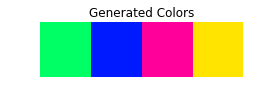

In [62]:
dbscan = DBSCAN(eps=0.1, min_samples=350)
result = dbscan.fit(covid_cases)
num_clusters = len(set(result.labels_))
colors = generate_colors(num_clusters, draw=True)

In [63]:
our_map = folium.Map(location=[32.427910, 53.688046], zoom_start=5)
for i, case in enumerate(covid_cases):
    folium.Circle(location=[case[0], case[1]], radius=1, color=colors[result.labels_[i] + 1], fill=True).add_to(our_map)


In [64]:
our_map